## Getting Ready

**Before we start downloading the data set, we need the Kaggle API token. To get that**

    1) Login into your Kaggle account

    2) Get into your account settings page

    3) Click on Create a new API token
    
    4) This will prompt you to download the .json file into your system. Save the file, and we will use it in the next step.

## Data pre-processing: remove redundant columns, min-max scaling

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
# Config display
import sys
import warnings
import numpy as np
import pandas as pd
from skimpy import skim
import pickle
from sklearn.ensemble import RandomForestClassifier
from sklearn.utils.discovery import all_displays
# from tune_sklearn import TuneGridSearchCV
# from sklearn.tree import export_graphviz

warnings.filterwarnings("ignore")
pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", None)
pd.set_option("display.float_format", lambda x: "%.3f" % x)
pd.set_option("display.width", 500)

# Config sys path
if ('../' not in sys.path):
    sys.path.append('../')
    
# Import library
from fraud import *
from sklearn.model_selection import train_test_split

# Set seed
seed = 4263

In [3]:
# Download and load dataset 
download_path = "../data/raw"
df = download_and_load(download_path)
df.head(5)
df.describe()

Skipping, found downloaded files in "../data/raw\dataset-phishing-domain-detection-cybersecurity" (use force=True to force download)


,qty_dot_url,qty_hyphen_url,qty_underline_url,qty_slash_url,qty_questionmark_url,qty_equal_url,qty_at_url,qty_and_url,qty_exclamation_url,qty_space_url,qty_tilde_url,qty_comma_url,qty_plus_url,qty_asterisk_url,qty_hashtag_url,qty_dollar_url,qty_percent_url,qty_tld_url,length_url,qty_dot_domain,qty_hyphen_domain,qty_underline_domain,qty_slash_domain,qty_questionmark_domain,qty_equal_domain,qty_at_domain,qty_and_domain,qty_exclamation_domain,qty_space_domain,qty_tilde_domain,qty_comma_domain,qty_plus_domain,qty_asterisk_domain,qty_hashtag_domain,qty_dollar_domain,qty_percent_domain,qty_vowels_domain,domain_length,domain_in_ip,server_client_domain,qty_dot_directory,qty_hyphen_directory,qty_underline_directory,qty_slash_directory,qty_questionmark_directory,qty_equal_directory,qty_at_directory,qty_and_directory,qty_exclamation_directory,qty_space_directory,qty_tilde_directory,qty_comma_directory,qty_plus_directory,qty_asterisk_directory,qty_hashtag_directory,qty_dollar_directory,qty_percent_directory,directory_length,qty_dot_file,qty_hyphen_file,qty_underline_file,qty_slash_file,qty_questionmark_file,qty_equal_file,qty_at_file,qty_and_file,qty_exclamation_file,qty_space_file,qty_tilde_file,qty_comma_file,qty_plus_file,qty_asterisk_file,qty_hashtag_file,qty_dollar_file,qty_percent_file,file_length,qty_dot_params,qty_hyphen_params,qty_underline_params,qty_slash_params,qty_questionmark_params,qty_equal_params,qty_at_params,qty_and_params,qty_exclamation_params,qty_space_params,qty_tilde_params,qty_comma_params,qty_plus_params,qty_asterisk_params,qty_hashtag_params,qty_dollar_params,qty_percent_params,params_length,tld_present_params,qty_params,email_in_url,time_response,domain_spf,asn_ip,time_domain_activation,time_domain_expiration,qty_ip_resolved,qty_nameservers,qty_mx_servers,ttl_hostname,tls_ssl_certificate,qty_redirects,url_google_index,domain_google_index,url_shortened,phishing
count,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00
mean,2.22,0.37,0.13,1.49,0.01,0.24,0.03,0.16,0.00,0.00,0.00,0.00,0.00,0.01,0.00,0.00,0.12,1.05,39.10,1.85,0.12,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,5.44,18.40,0.00,0.00,-0.21,-0.26,-0.39,0.99,-0.46,-0.45,-0.46,-0.46,-0.46,-0.46,-0.46,-0.46,-0.46,-0.46,-0.46,-0.46,-0.40,12.80,-0.27,-0.39,-0.43,-0.46,-0.46,-0.46,-0.46,-0.46,-0.46,-0.46,-0.46,-0.46,-0.46,-0.46,-0.46,-0.46,-0.42,3.37,-0.78,-0.86,-0.84,-0.87,-0.89,-0.68,-0.88,-0.75,-0.90,-0.90,-0.90,-0.90,-0.90,-0.90,-0.90,-0.90,-0.84,6.29,-0.87,-0.72,0.02,0.79,-0.02,31857.09,3120.12,333.85,1.13,2.79,1.71,5806.97,0.51,0.33,0.00,0.00,0.01,0.40
std,1.31,1.20,0.71,1.96,0.12,1.03,0.29,0.99,0.10,0.08,0.08,0.08,0.13,0.34,0.07,0.10,1.89,0.27,49.77,0.74,0.44,0.03,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,2.60,6.84,0.05,0.06,0.93,1.16,0.70,2.27,0.50,0.52,0.55,0.54,0.50,0.51,0.51,0.50,0.51,0.60,0.50,0.51,1.68,25.86,0.78,0.83,0.61,0.50,0.50,0.50,0.50,0

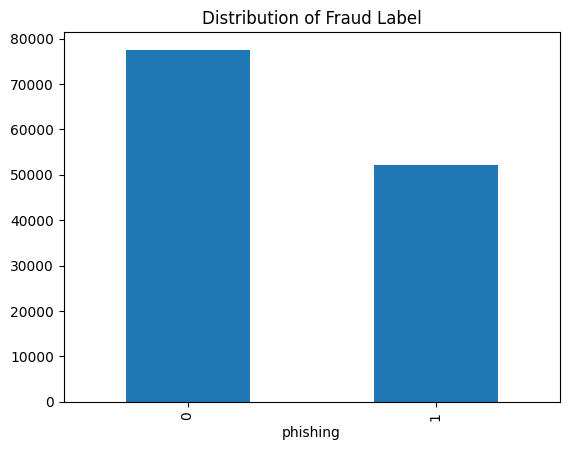

In [4]:
# Data Preprocessing and visualize data before training
upload_path = "../data/processed"
df = upload(preprocess(df), upload_path)
pre_plot(df)

In [5]:
# Overview of data
df.info()
df.describe()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 129698 entries, 0 to 129697
Data columns (total 86 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   qty_dot_url                 129698 non-null  float64
 1   qty_hyphen_url              129698 non-null  float64
 2   qty_underline_url           129698 non-null  float64
 3   qty_slash_url               129698 non-null  float64
 4   qty_questionmark_url        129698 non-null  float64
 5   qty_equal_url               129698 non-null  float64
 6   qty_at_url                  129698 non-null  float64
 7   qty_and_url                 129698 non-null  float64
 8   qty_exclamation_url         129698 non-null  float64
 9   qty_space_url               129698 non-null  float64
 10  qty_tilde_url               129698 non-null  float64
 11  qty_comma_url               129698 non-null  float64
 12  qty_plus_url                129698 non-null  float64
 13  qty_asterisk_u

,qty_dot_url,qty_hyphen_url,qty_underline_url,qty_slash_url,qty_questionmark_url,qty_equal_url,qty_at_url,qty_and_url,qty_exclamation_url,qty_space_url,qty_tilde_url,qty_comma_url,qty_plus_url,qty_asterisk_url,qty_hashtag_url,qty_dollar_url,qty_percent_url,qty_tld_url,length_url,qty_dot_domain,qty_hyphen_domain,qty_underline_domain,qty_at_domain,qty_vowels_domain,domain_length,qty_dot_directory,qty_hyphen_directory,qty_underline_directory,qty_slash_directory,qty_questionmark_directory,qty_equal_directory,qty_at_directory,qty_and_directory,qty_exclamation_directory,qty_space_directory,qty_tilde_directory,qty_comma_directory,qty_plus_directory,qty_asterisk_directory,qty_hashtag_directory,qty_dollar_directory,qty_percent_directory,directory_length,qty_dot_file,qty_hyphen_file,qty_underline_file,qty_slash_file,qty_questionmark_file,qty_equal_file,qty_at_file,qty_and_file,qty_exclamation_file,qty_space_file,qty_tilde_file,qty_comma_file,qty_plus_file,qty_asterisk_file,qty_hashtag_file,qty_dollar_file,qty_percent_file,file_length,qty_dot_params,qty_hyphen_params,qty_underline_params,qty_slash_params,qty_questionmark_params,qty_equal_params,qty_at_params,qty_and_params,qty_exclamation_params,qty_space_params,qty_tilde_params,qty_comma_params,qty_plus_params,qty_asterisk_params,qty_hashtag_params,qty_dollar_params,qty_percent_params,params_length,tld_present_params,qty_params,email_in_url,url_google_index,domain_google_index,url_shortened,phishing
count,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00,129698.00
mean,0.05,0.01,0.01,0.03,0.00,0.01,0.00,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.09,0.01,0.09,0.01,0.00,0.00,0.09,0.06,0.04,0.03,0.03,0.09,0.54,0.09,0.01,0.02,0.05,0.05,0.09,0.09,0.03,0.01,0.54,0.05,0.00,0.01,0.06,0.03,0.03,0.54,0.54,0.14,0.18,0.14,0.11,0.05,0.11,0.09,0.03,0.01,0.54,0.54,0.00,0.00,0.01,0.00,0.01,0.00,0.01,0.01,0.01,0.01,0.01,0.02,0.05,0.01,0.01,0.02,0.10,0.02,0.00,0.00,0.06,0.01,0.02,0.50,0.50,0.01,0.40
std,0.06,0.03,0.03,0.04,0.01,0.04,0.01,0.04,0.01,0.01,0.02,0.01,0.01,0.01,0.01,0.01,0.01,0.02,0.01,0.04,0.04,0.01,0.00,0.04,0.03,0.05,0.05,0.04,0.10,0.50,0.09,0.01,0.02,0.05,0.05,0.08,0.08,0.03,0.01,0.50,0.05,0.01,0.02,0.06,0.04,0.03,0.50,0.50,0.13,0.17,0.13,0.10,0.05,0.10,0.08,0.03,0.01,0.50,0.50,0.01,0.01,0.04,0.02,0.03,0.01,0.03,0.05,0.04,0.05,0.03,0.06,0.15,0.03,0.04,0.06,0.30,0.06,0.02,0.01,0.20,0.04,0.14,0.03,0.03,0.08,0.49
min,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,0.04,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.08,0.00,0.05,0.00,0.00,0.00,0.07,0.04,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0

In [6]:
skim(df)

╭──────────────────────────────────────────────── skimpy summary ─────────────────────────────────────────────────╮
│          Data Summary                Data Types                                                                 │
│ ┏━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┓ ┏━━━━━━━━━━━━━┳━━━━━━━┓                                                          │
│ ┃ dataframe         ┃ Values ┃ ┃ Column Type ┃ Count ┃                                                          │
│ ┡━━━━━━━━━━━━━━━━━━━╇━━━━━━━━┩ ┡━━━━━━━━━━━━━╇━━━━━━━┩                                                          │
│ │ Number of rows    │ 129698 │ │ float64     │ 85    │                                                          │
│ │ Number of columns │ 86     │ │ int32       │ 1     │                                                          │
│ └───────────────────┴────────┘ └─────────────┴───────┘                                                          │
│                                                     number                                                      │
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━┳━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━┳━━━━┳━━━━━━━━┳━━━━━━━━━┳━━━━━━━━┳━━━━━━┳━━━━━━━━┓  │
│ ┃ column_name            ┃ NA  ┃ NA %  ┃ mean     ┃ sd      ┃ p0 ┃ p25    ┃ p50     ┃ p75    ┃ p100 ┃ hist   ┃  │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━╇━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━╇━━━━╇━━━━━━━━╇━━━━━━━━━╇━━━━━━━━╇━━━━━━╇━━━━━━━━┩  │
│ │ qty_dot_url            │   0 │     0 │    0.053 │   0.057 │  0 │  0.043 │   0.043 │  0.043 │    1 │   ▇    │  │
│ │ qty_hyphen_url         │   0 │     0 │    0.011 │   0.034 │  0 │      0 │       0 │      0 │    1 │   ▇    │  │
│ │ qty_underline_url      │   0 │     0 │   0.0063 │   0.034 │  0 │      0 │       0 │      0 │    1 │   ▇    │  │
│ │ qty_slash_url          │   0 │     0 │    0.034 │   0.045 │  0 │      0 │   0.023 │  0.068 │    1 │   ▇    │  │
│ │ qty_questionmark_url   │   0 │     0 │   0.0012 │   0.014 │  0 │      0 │       0 │      0 │    1 │   ▇    │  │
│ │ qty_equal_url          │   0 │     0 │     0.01 │   0.045 │  0 │      0 │       0 │      0 │    1 │   ▇    │  │
│ │ qty_at_url             │   0 │     0 │   0.0006 │  0.0068 │  0 │      0 │       0 │      0 │    1 │   ▇    │  │
│ │ qty_and_url            │   0 │     0 │   0.0063 │   0.038 │  0 │      0 │       0 │      0 │    1 │   ▇    │  │
│ │ qty_exclamation_url    │   0 │     0 │  0.00035 │  0.0098 │  0 │      0 │       0 │      0 │    1 │   ▇    │  │
│ │ qty_space_url          │   0 │     0 │  0.00014 │   0.009 │  0 │      0 │       0 │      0 │    1 │   ▇    │  │
│ │ qty_tilde_url          │   0 │     0 │  0.00074 │   0.017 │  0 │      0 │       0 │      0 │    1 │   ▇    │  │
│ │ qty_comma_url          │   0 │     0 │  0.00023 │   0.007 │  0 │      0 │       0 │      0 │    1 │   ▇    │  │
│ │ qty_plus_url           │   0 │     0 │  0.00018 │  0.0066 │  0 │      0 │       0 │      0 │    1 │   ▇    │  │
│ │ qty_asterisk_url       │   0 │     0 │    9e-05 │  0.0056 │  0 │      0 │       0 │      0 │    1 │   ▇    │  │
│ │ qty_hashtag_url        │   0 │     0 │  4.7e-05 │  0.0052 │  0 │      0 │       0 │      0 │    1 │   ▇    │  │
│ │ qty_dollar_url         │   0 │     0 │  0.00021 │    0.01 │  0 │      0 │       0 │      0 │    1 │   ▇    │  │
│ │ qty_percent_url        │   0 │     0 │  0.00072 │   0.011 │  0 │      0 │       0 │      0 │    1 │   ▇    │  │
│ │ qty_tld_url            │   0 │     0 │    0.088 │   0.023 │  0 │  0.083 │   0.083 │  0.083 │    1 │   ▇    │  │
│ │ length_url             │   0 │     0 │   0.0084 │   0.012 │  0 │ 0.0031 │  0.0046 │ 0.0094 │    1 │   ▇    │  │
│ │ qty_dot_domain         │   0 │     0 │    0.088 │   0.035 │  0 │  0.048 │   0.095 │  0.095 │    1 │   ▇    │  │
│ │ qty_hyphen_domain      │   0 │     0 │    0.011 │    0.04 │  0 │      0 │       0 │      0 │    1 │   ▇    │  │
│ │ qty_underline_domain   │   0 │     0 │  0.00021 │  0.0098 │  0 │      0 │       0 │      0 │    1 │   ▇    │  │
│ │ qty_at_domain          │   0 │     0 │  7.7e-06 │  0

## Lazy Prediction

Lazy prediction runs multiple classification models.

In [7]:
# Lazy prediction
lazy_predict(df, exclude=None)

  5%|▍         | 1/22 [00:09<03:19,  9.51s/it]

{'Model': 'AdaBoostClassifier', 'Accuracy': 0.8968003084040093, 'Balanced Accuracy': 0.8954109507043757, 'ROC AUC': 0.8954109507043757, 'F1 Score': 0.8970607514069568, 'Time taken': 9.509078025817871}


  9%|▉         | 2/22 [00:16<02:42,  8.10s/it]

{'Model': 'BaggingClassifier', 'Accuracy': 0.9464919043947572, 'Balanced Accuracy': 0.9400750164523889, 'ROC AUC': 0.940075016452389, 'F1 Score': 0.9462356760268839, 'Time taken': 7.1210856437683105}


 14%|█▎        | 3/22 [00:17<01:28,  4.67s/it]

{'Model': 'BernoulliNB', 'Accuracy': 0.8402852737085582, 'Balanced Accuracy': 0.8623674673478425, 'ROC AUC': 0.8623674673478425, 'F1 Score': 0.8415394061669077, 'Time taken': 0.5838041305541992}


 18%|█▊        | 4/22 [00:18<01:00,  3.37s/it]

{'Model': 'DecisionTreeClassifier', 'Accuracy': 0.9456437933693138, 'Balanced Accuracy': 0.9380160068486494, 'ROC AUC': 0.9380160068486495, 'F1 Score': 0.9453022354373574, 'Time taken': 1.3807671070098877}


 23%|██▎       | 5/22 [00:19<00:40,  2.38s/it]

{'Model': 'DummyClassifier', 'Accuracy': 0.5978797224363916, 'Balanced Accuracy': 0.5, 'ROC AUC': 0.5, 'F1 Score': 0.44741810973803947, 'Time taken': 0.62312912940979}


 27%|██▋       | 6/22 [00:19<00:28,  1.80s/it]

{'Model': 'ExtraTreeClassifier', 'Accuracy': 0.9456052428681573, 'Balanced Accuracy': 0.9379052940144497, 'ROC AUC': 0.9379052940144496, 'F1 Score': 0.9452584268048442, 'Time taken': 0.6600816249847412}


 32%|███▏      | 7/22 [00:37<01:42,  6.83s/it]

{'Model': 'ExtraTreesClassifier', 'Accuracy': 0.9490362374710871, 'Balanced Accuracy': 0.9422969814027227, 'ROC AUC': 0.9422969814027227, 'F1 Score': 0.9487652236647476, 'Time taken': 17.175180912017822}


 36%|███▋      | 8/22 [00:37<01:08,  4.86s/it]

{'Model': 'GaussianNB', 'Accuracy': 0.7273323053199692, 'Balanced Accuracy': 0.6684645811559567, 'ROC AUC': 0.6684645811559566, 'F1 Score': 0.6932312311264228, 'Time taken': 0.6383645534515381}


 41%|████      | 9/22 [00:56<01:58,  9.11s/it]

{'Model': 'KNeighborsClassifier', 'Accuracy': 0.9271395528141866, 'Balanced Accuracy': 0.9215523553331024, 'ROC AUC': 0.9215523553331025, 'F1 Score': 0.9269296763134706, 'Time taken': 18.45733380317688}


 45%|████▌     | 10/22 [01:00<01:32,  7.67s/it]

{'Model': 'LinearDiscriminantAnalysis', 'Accuracy': 0.8773708558211257, 'Balanced Accuracy': 0.8866016076624841, 'ROC AUC': 0.8866016076624841, 'F1 Score': 0.8784633568588365, 'Time taken': 4.457732200622559}


 50%|█████     | 11/22 [01:04<01:11,  6.50s/it]

{'Model': 'LogisticRegression', 'Accuracy': 0.8917501927525058, 'Balanced Accuracy': 0.8890688123117444, 'ROC AUC': 0.8890688123117444, 'F1 Score': 0.8919191057986454, 'Time taken': 3.836017608642578}


 55%|█████▍    | 12/22 [01:05<00:47,  4.71s/it]

{'Model': 'NearestCentroid', 'Accuracy': 0.8402852737085582, 'Balanced Accuracy': 0.8623674673478425, 'ROC AUC': 0.8623674673478425, 'F1 Score': 0.8415394061669077, 'Time taken': 0.6154866218566895}


 59%|█████▉    | 13/22 [01:06<00:32,  3.56s/it]

{'Model': 'PassiveAggressiveClassifier', 'Accuracy': 0.8554741711642251, 'Balanced Accuracy': 0.868540774927036, 'ROC AUC': 0.8685407749270357, 'F1 Score': 0.8568694647388932, 'Time taken': 0.9290580749511719}


 64%|██████▎   | 14/22 [01:07<00:22,  2.79s/it]

{'Model': 'Perceptron', 'Accuracy': 0.8783731688511951, 'Balanced Accuracy': 0.8684806356141228, 'ROC AUC': 0.8684806356141228, 'F1 Score': 0.877674247975305, 'Time taken': 1.0074117183685303}


 68%|██████▊   | 15/22 [01:09<00:18,  2.64s/it]

{'Model': 'QuadraticDiscriminantAnalysis', 'Accuracy': 0.6986121819583655, 'Balanced Accuracy': 0.6266013977404914, 'ROC AUC': 0.6266013977404914, 'F1 Score': 0.6412300293215699, 'Time taken': 2.301440954208374}


 73%|███████▎  | 16/22 [01:27<00:43,  7.21s/it]

{'Model': 'RandomForestClassifier', 'Accuracy': 0.9488820354664611, 'Balanced Accuracy': 0.9430783164990545, 'ROC AUC': 0.9430783164990544, 'F1 Score': 0.9486696114792943, 'Time taken': 17.79897689819336}


 77%|███████▋  | 17/22 [01:27<00:26,  5.27s/it]

{'Model': 'RidgeClassifier', 'Accuracy': 0.8777563608326908, 'Balanced Accuracy': 0.8868769170178672, 'ROC AUC': 0.8868769170178673, 'F1 Score': 0.8788411806474443, 'Time taken': 0.7792627811431885}


 82%|████████▏ | 18/22 [01:33<00:20,  5.24s/it]

{'Model': 'RidgeClassifierCV', 'Accuracy': 0.8777563608326908, 'Balanced Accuracy': 0.8868769170178672, 'ROC AUC': 0.8868769170178673, 'F1 Score': 0.8788411806474443, 'Time taken': 5.171341180801392}


 86%|████████▋ | 19/22 [01:35<00:12,  4.28s/it]

{'Model': 'SGDClassifier', 'Accuracy': 0.88053199691596, 'Balanced Accuracy': 0.8654520719872458, 'ROC AUC': 0.8654520719872459, 'F1 Score': 0.878942879649337, 'Time taken': 2.0273072719573975}
StackingClassifier model failed to execute
StackingClassifier.__init__() missing 1 required positional argument: 'estimators'


 95%|█████████▌| 21/22 [01:37<00:02,  2.89s/it]

{'Model': 'XGBClassifier', 'Accuracy': 0.9291827293754819, 'Balanced Accuracy': 0.9236063239655521, 'ROC AUC': 0.9236063239655521, 'F1 Score': 0.9289729906455365, 'Time taken': 2.567840814590454}
[LightGBM] [Info] Number of positive: 41721, number of negative: 62037
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018437 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1843
[LightGBM] [Info] Number of data points in the train set: 103758, number of used features: 83
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.402099 -> initscore=-0.396726
[LightGBM] [Info] Start training from score -0.396726


100%|██████████| 22/22 [01:40<00:00,  4.55s/it]

{'Model': 'LGBMClassifier', 'Accuracy': 0.9252891287586739, 'Balanced Accuracy': 0.9201932031523978, 'ROC AUC': 0.9201932031523979, 'F1 Score': 0.9251216874416934, 'Time taken': 2.520585775375366}


,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,Time Taken
Model,,,,,
RandomForestClassifier,0.95,0.94,0.94,0.95,17.80
ExtraTreesClassifier,0.95,0.94,0.94,0.95,17.18
BaggingClassifier,0.95,0.94,0.94,0.95,7.12
DecisionTreeClassifier,0.95,0.94,0.94,0.95,1.38
ExtraTreeClassifier,0.95,0.94,0.94,0.95,0.66
XGBClassifier,0.93,0.92,0.92,0.93,2.57
KNeighborsClassifier,0.93,0.92,0.92,0.93,18.46
LGBMClassifier,0.93,0.92,0.92,0.93,2.52
AdaBoostClassifier,0.90,0.90,0.90,0.90,9.51


Through lazy prediction, the best performing models are **RandomForestClassifier, ExtraTreesClassifier, BaggingClassifier, DecisionTreeClassifier**

## Best Model Fitting

In [8]:
# Train test split
X = df.drop("phishing", axis=1)
y = df["phishing"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=seed, stratify=df["phishing"])
feat_cols = np.array(X_train.columns)

In [9]:
# Default model training
clf = train(RandomForestClassifier(random_state=seed), X_train, y_train, path="../models/model_phishing_domain.pkl")
y_pred = predict(clf, X_test, y_test)

Accuracy: 0.9513878180416345
Recall: 0.9186079953983319


In [10]:
# Hyperparameters
print("max_depth: ", max((e.tree_.max_depth for e in clf.estimators_)))
print("min_depth: ", min((e.tree_.max_depth for e in clf.estimators_)))
print("max_depth: ", clf.get_params())

max_depth:  51
min_depth:  37
max_depth:  {'bootstrap': True, 'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': 'sqrt', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': 4263, 'verbose': 0, 'warm_start': False}


In [11]:
# Hyperparameter tuning
iterations = 30
param_grid = {
    "n_estimators": [25, 50, 100, 200],
    "max_depth": [30, 40, 50],
    "min_samples_split": [1, 2, 4],
    # "max_features": ["sqrt", "log2"]
}

model, best_params = train(RandomForestClassifier(random_state=seed), X_train, y_train, param_grid, iterations, path="../models/tuned_model_phishing_domain.pkl")
y_pred = predict(model, X_test, y_test)

Fitting 5 folds for each of 30 candidates, totalling 150 fits
Best Hyperparameters: {'n_estimators': 100, 'min_samples_split': 2, 'max_depth': 50}
Accuracy: 0.9513107170393215
Recall: 0.9184162592273032


## Feature Importance

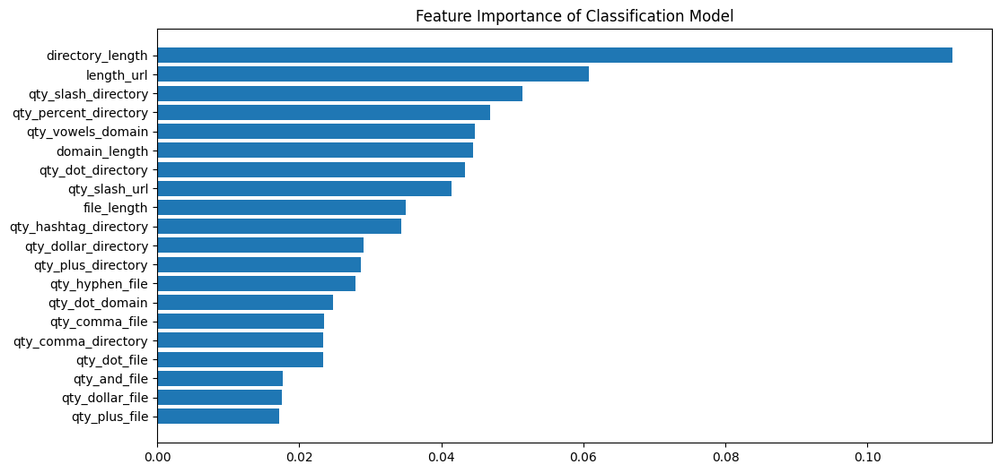

In [12]:
feat_importance(model, feat_cols, path="../features/features_phishing_domain.pkl")

Explainer expected value: [0.49191489 0.50808511]


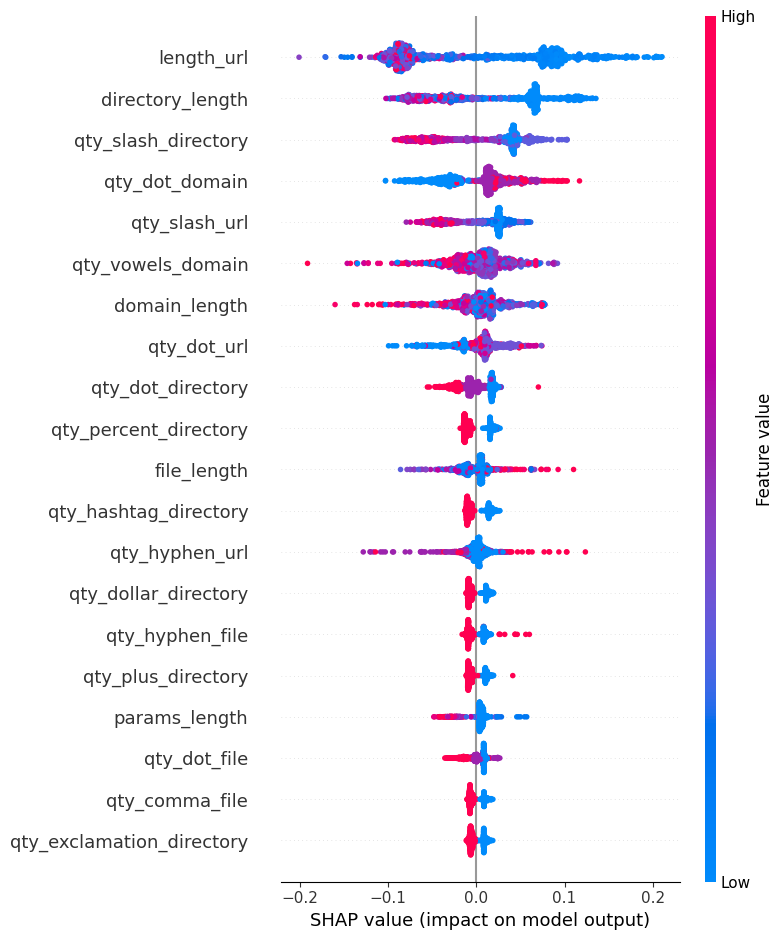

In [13]:
shap_plot(df, "phishing", 1000)

In [14]:
lime_plot(X_train, X_test, y_test, 5, model)

Instance 1:
True Class: Not Phishing
Predicted Class: Not Phishing
Explanation for Predicted Class:


Instance 2:
True Class: Not Phishing
Predicted Class: Not Phishing
Explanation for Predicted Class:


Instance 3:
True Class: Phishing
Predicted Class: Phishing
Explanation for Predicted Class:


Instance 4:
True Class: Phishing
Predicted Class: Phishing
Explanation for Predicted Class:


Instance 5:
True Class: Phishing
Predicted Class: Phishing
Explanation for Predicted Class:


### Experiment: What would the performance be after performing feature selection?


[info]: k = 10, currently selecting top 10 features.
Accuracy: 0.8976098689282961
Recall: 0.8561020036429873


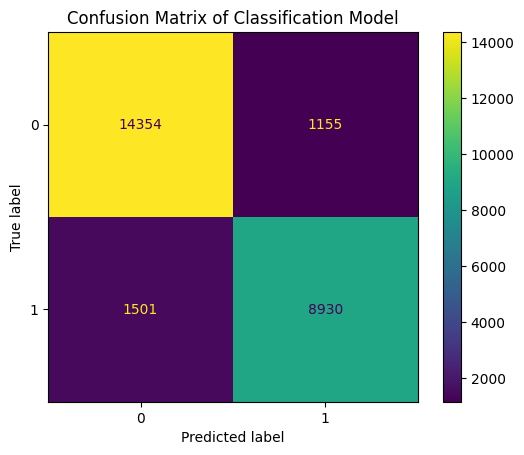

[info]: k = 20, currently selecting top 20 features.
Accuracy: 0.8993446414803392
Recall: 0.8541846419327006


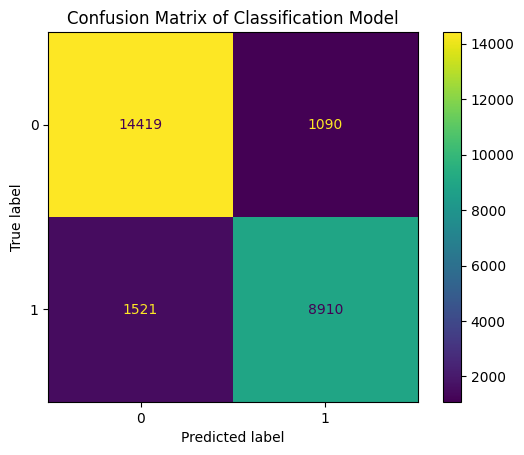

[info]: k = 30, currently selecting top 30 features.
Accuracy: 0.8999614494988435
Recall: 0.8543763781037292


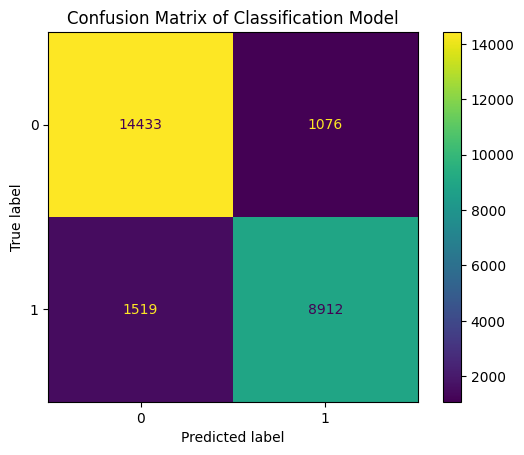

[info]: k = 40, currently selecting top 40 features.
Accuracy: 0.9413646877409406
Recall: 0.8946409740197488


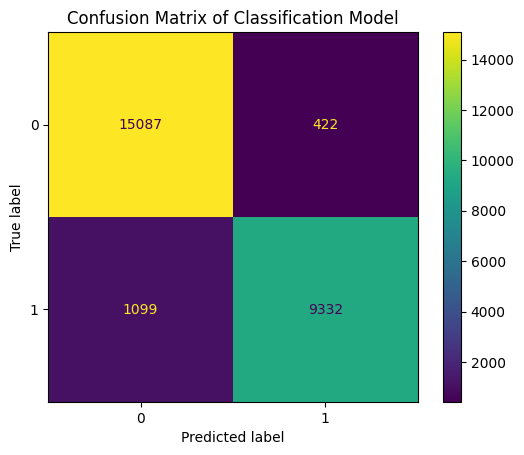

[info]: k = 50, currently selecting top 50 features.
Accuracy: 0.9413646877409406
Recall: 0.8945451059342345


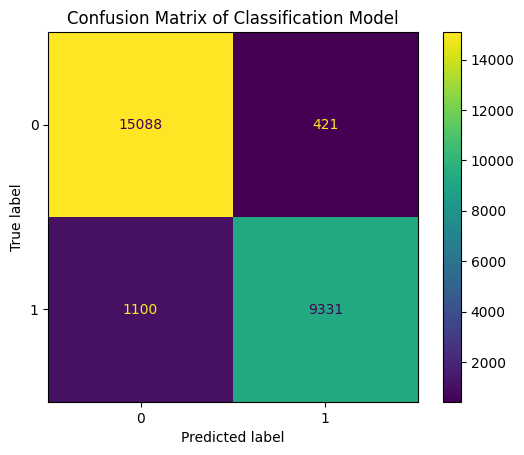

[info]: k = 60, currently selecting top 60 features.
Accuracy: 0.9412875867386276
Recall: 0.8914773271977758


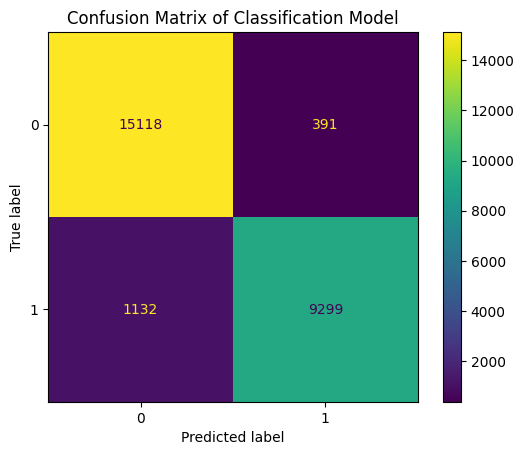

[info]: k = 70, currently selecting top 70 features.
Accuracy: 0.9508481110254433
Recall: 0.9178410507142173


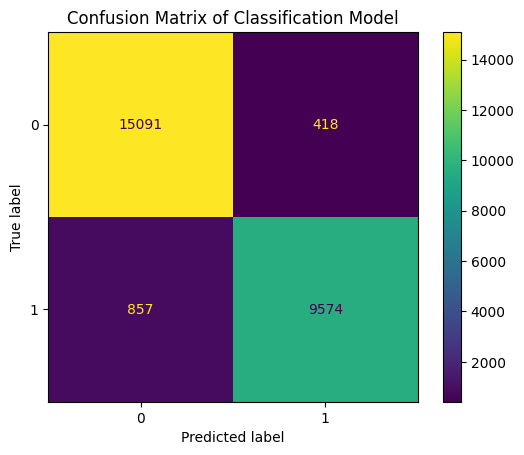

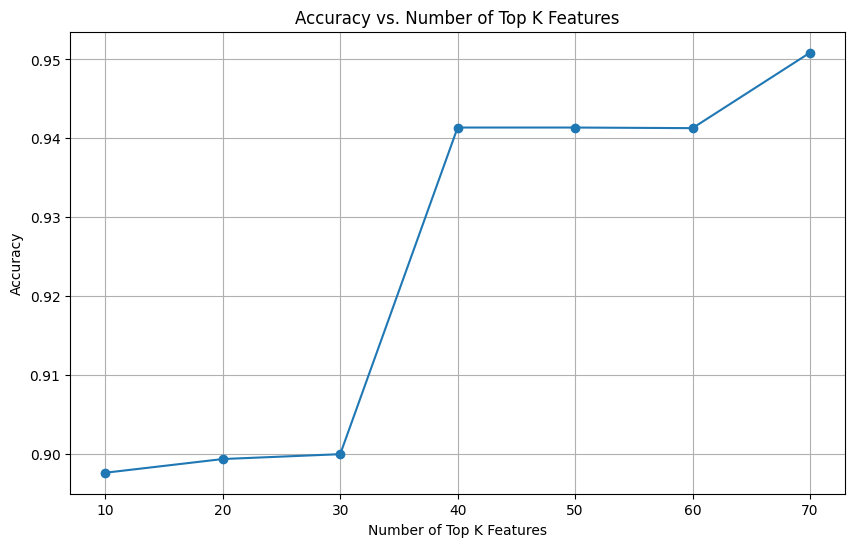

In [16]:
# Top K features selection based on mutual information 
plot_accuracy_vs_k(df, "phishing", range(10, 80, 10)) 

## Evaluation

In [17]:
displays = all_displays()
displays

[('CalibrationDisplay', sklearn.calibration.CalibrationDisplay),
 ('ConfusionMatrixDisplay',
  sklearn.metrics._plot.confusion_matrix.ConfusionMatrixDisplay),
 ('DecisionBoundaryDisplay',
  sklearn.inspection._plot.decision_boundary.DecisionBoundaryDisplay),
 ('DetCurveDisplay', sklearn.metrics._plot.det_curve.DetCurveDisplay),
 ('LearningCurveDisplay', sklearn.model_selection._plot.LearningCurveDisplay),
 ('PartialDependenceDisplay',
  sklearn.inspection._plot.partial_dependence.PartialDependenceDisplay),
 ('PrecisionRecallDisplay',
  sklearn.metrics._plot.precision_recall_curve.PrecisionRecallDisplay),
 ('PredictionErrorDisplay',
  sklearn.metrics._plot.regression.PredictionErrorDisplay),
 ('RocCurveDisplay', sklearn.metrics._plot.roc_curve.RocCurveDisplay),
 ('ValidationCurveDisplay',
  sklearn.model_selection._plot.ValidationCurveDisplay)]

In [ ]:
# Export tree as dot file

# for i in range(len(model.best_estimator_)):
#     export_graphviz(model.best_estimator_[i], out_file=f"visualization/tree_{i}.dot", 
#                 feature_names=cleaned_data.drop("phishing", axis=1).columns,
#                 class_names=["phishing"],
#                 filled=True,
#                 rounded=True, proportion=False, 
#                 precision=2, filled=True)

#     # Convert to png using system command (requires Graphviz)
#     # os.system('dot -Tpng tree.dot -o tree.png')
#     call(["dot", "-Tpng", f"tree_{i}.dot", "-o", f"tree_{i}.png", "-Gdpi=300"])

#     # Display in jupyter notebook
#     Image(filename = f"tree_{i}.png")

# Alternatively
# for i in range(len(model.best_estimator_)):
#     fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(4,4), dpi=300)
#     tree.plot_tree(model.best_estimator_[i],
#                 feature_names=list(cleaned_data.columns.drop("phishing")), 
#                 class_names=["phishing"],
#                 filled=True, 
#                 rounded=True, proportion=False, 
#                 precision=2)
    
#     fig.savefig(f"visualization/tree_{i}.png")

## Confusion Matrix

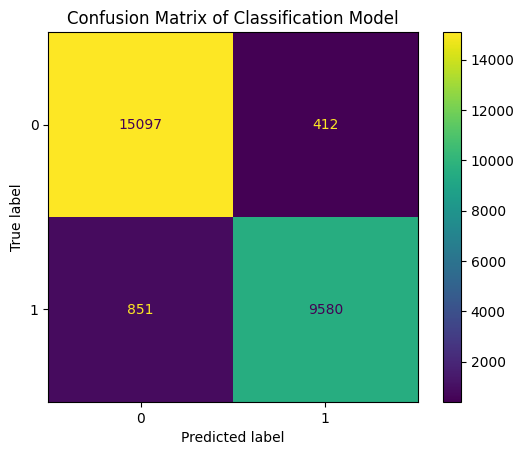

In [18]:
confusion_plot(y_test, y_pred)

## Precision-Recall

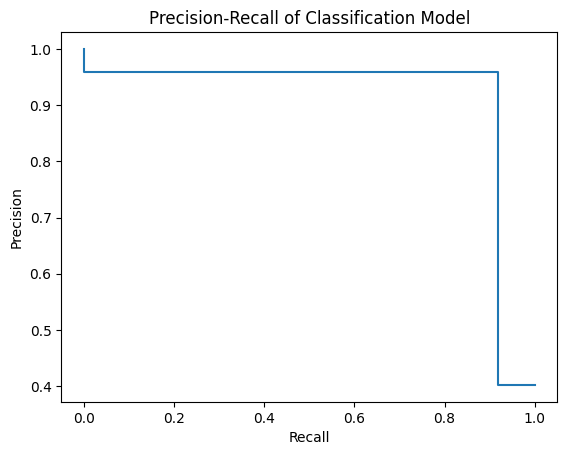

In [19]:
precision_recall(y_test, y_pred)

## ROC Curve

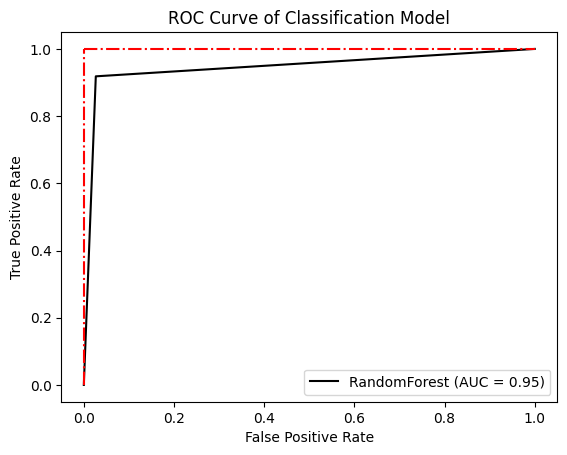

In [20]:
roc_curve(y_test, y_pred)

## Calibration Display

A perfectly calibrated model would have a calibration curve closely aligned with the 45-degree diagonal line on the plot. This line represents ideal calibration, where the **predicted probabilities match the observed frequencies**. Deviations from this diagonal line indicate either overconfidence or underconfidence in the model's predictions.

- Overconfidence: If the curve lies above the diagonal line, the model is overconfident. This means there are more instances with predicted probabilities close to 1 than there should be, and the model's confidence in its predictions is higher than the actual success rate.
- Underconfidence: If the curve lies below the diagonal line, the model is underconfident. In this case, instances with high predicted probabilities are less frequent than they should be and the model's confidence is lower than the actual success rate.

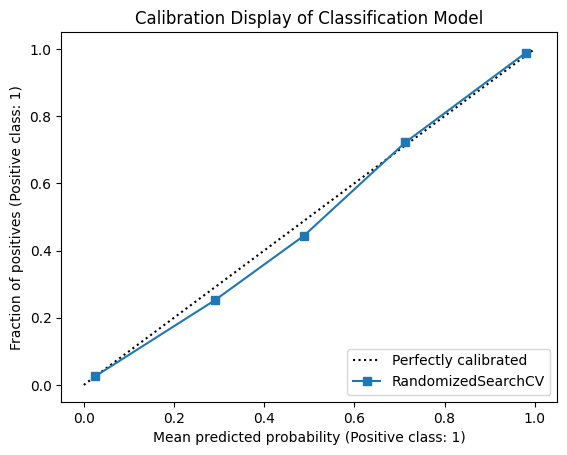

In [21]:
calibration_disp(model, X_test, y_test)

## Learning Curve

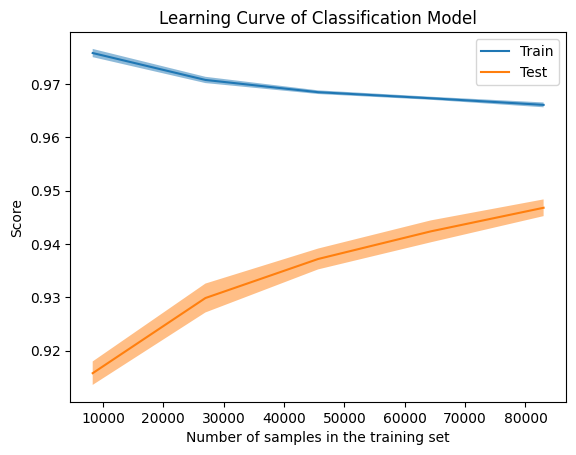

In [23]:
learning_curv(clf, X_train, y_train)

## Ice Curve (top 3 features)

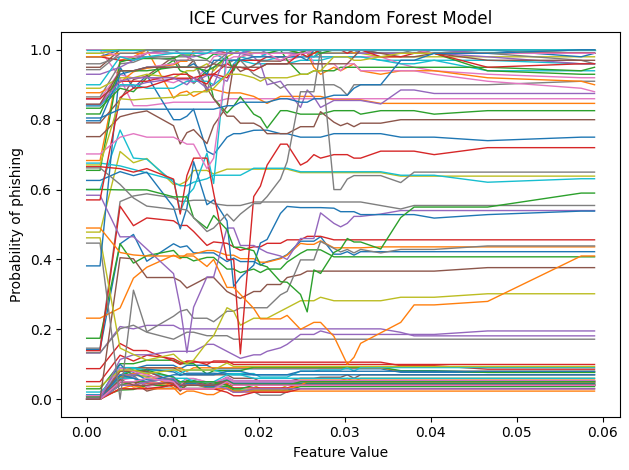

In [24]:
ice_curve("directory_length", X_train, model)

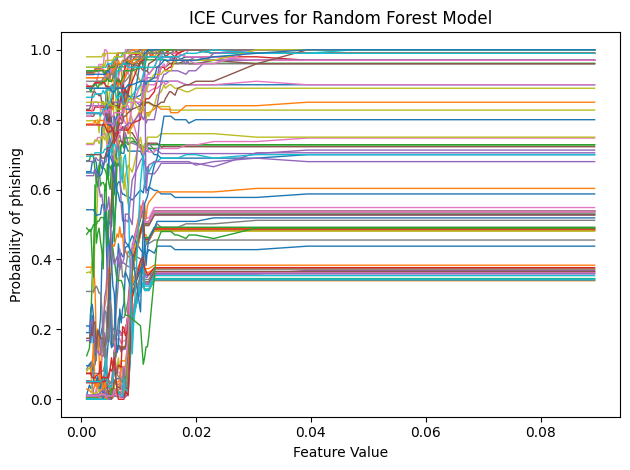

In [25]:
ice_curve("length_url", X_train, model)

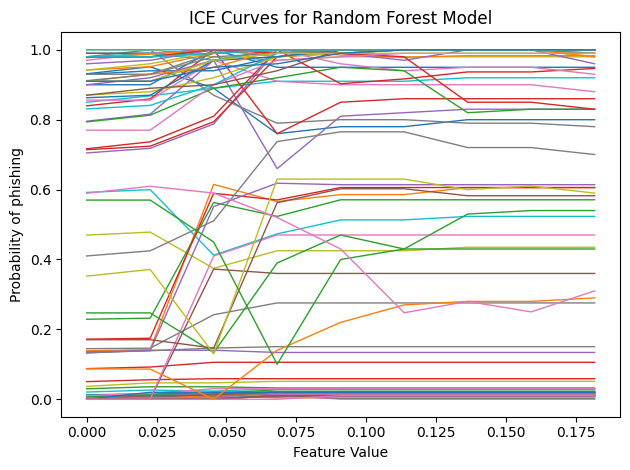

In [26]:
ice_curve("qty_slash_url", X_train, model)